Work analysis script
-------------------


John Chodera, Dom Rufa, Hannah Bruce Macdonald

In [3]:
import os
import numpy as np
import seaborn as sns
from pymbar import BAR
import matplotlib.pyplot as plt
import seaborn
import numpy as np
from glob import glob
import pickle
from simtk.openmm import unit
import bz2
from freeenergyframework import plotting

In [4]:
with bz2.BZ2File('fah_temp/work.pkl.bz2', 'r') as infile:
    work = pickle.load(infile)

In [5]:
# with open('/Users/brucemah/Downloads/work.pkl', 'rb') as infile:
#     work = pickle.load(infile)
    
# Plot by RUN
projects = {
    'complex' : 'PROJ13404',
    'solvent' : 'PROJ13405'
}
GEN = 'GEN0'

phase = 'complex'
PROJ = projects[phase]
run_index = 0
NRUNS = len(work[PROJ])

In [6]:
### TODO - unhardcode this

details_throm = np.load('data/Thrombin_results.npy',allow_pickle=True).flatten()[0]
details_jnk = np.load('data/Jnk1_results.npy',allow_pickle=True).flatten()[0]

In [7]:
details = {}

details.update(details_throm)
details.update(details_jnk)

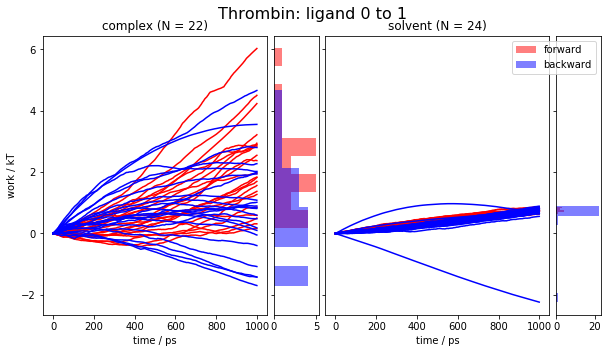

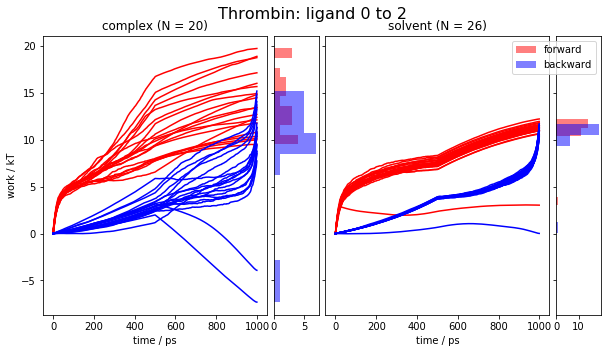

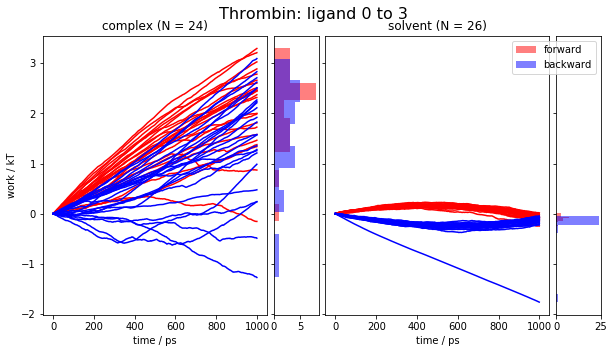

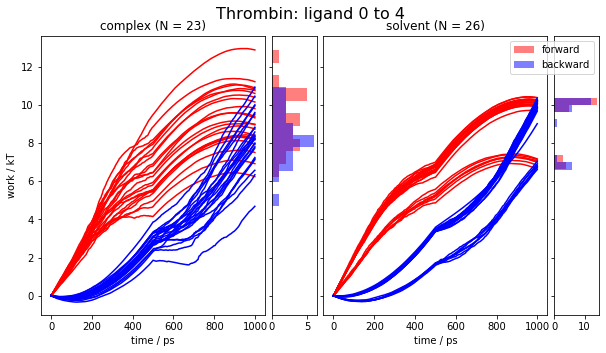

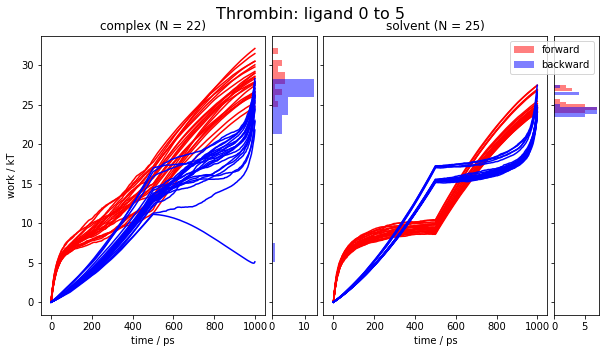

...

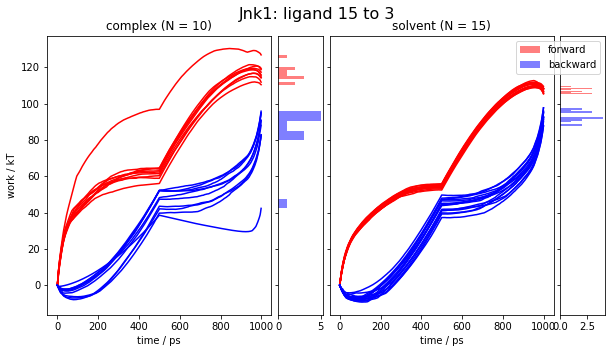

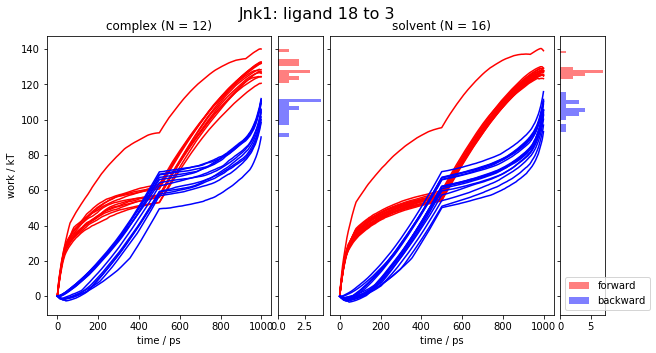

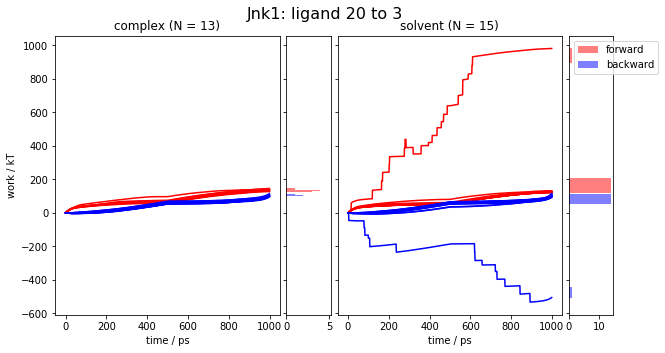

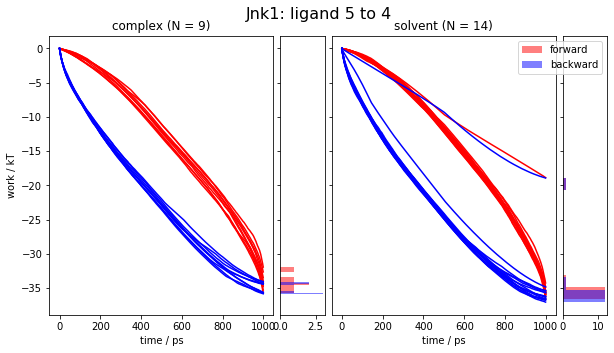

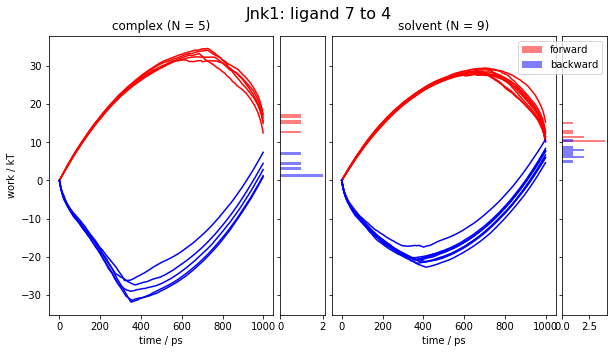

/Users/brucemah/miniconda3/lib/python3.6/site-packages/pymbar/bar.py:373: RuntimeWarning: invalid value encountered in sqrt
  dDeltaF = np.sqrt(variance)


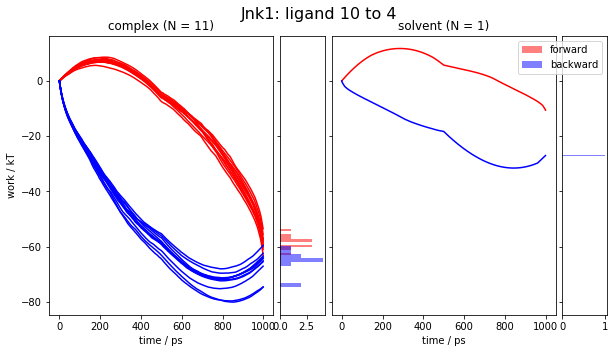

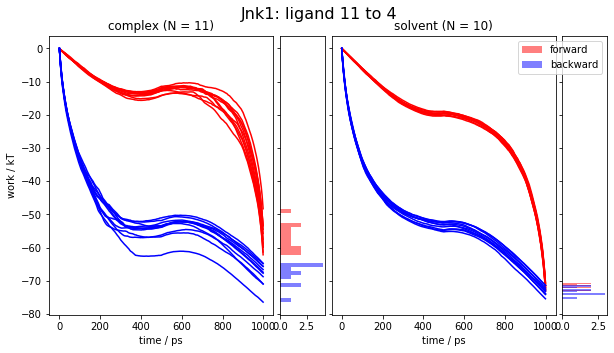

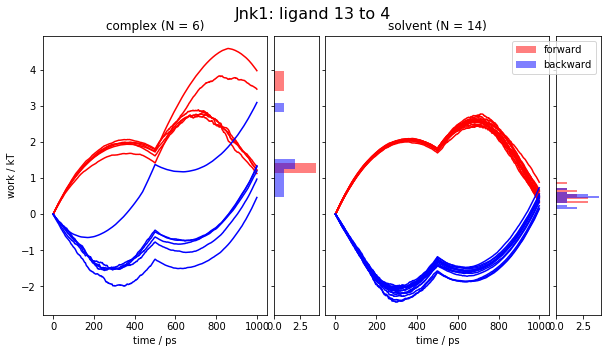

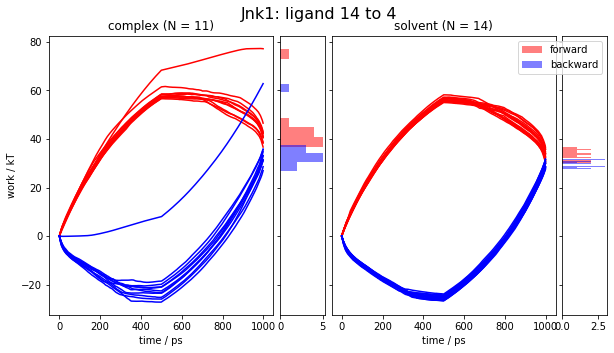

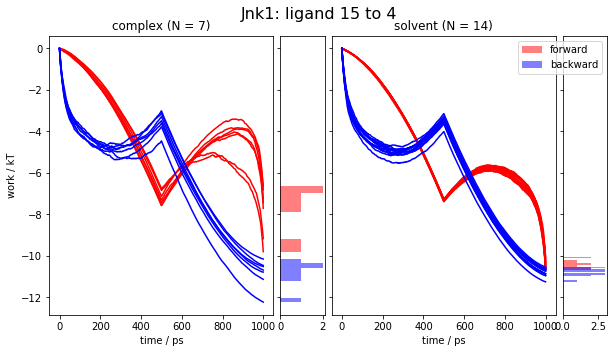

...

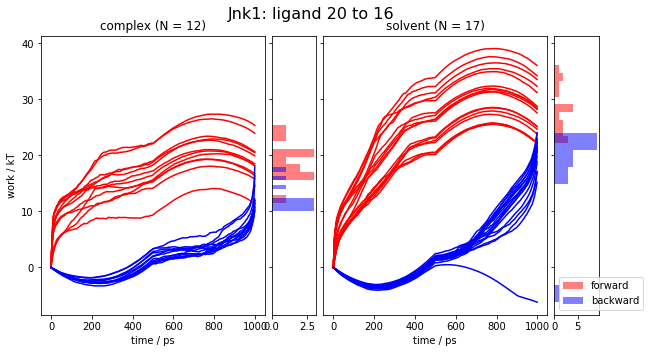

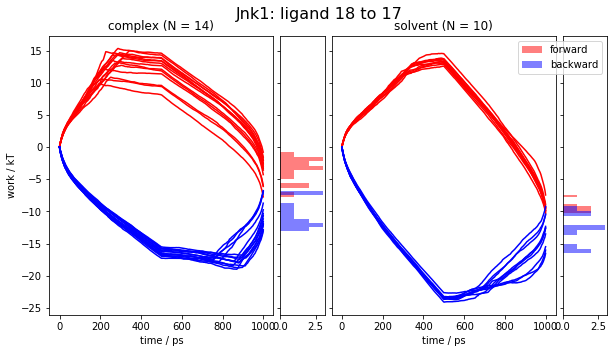

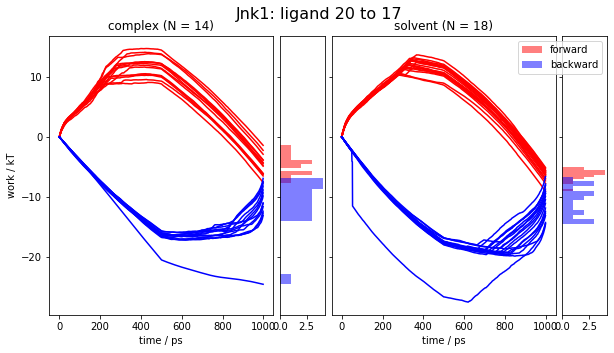

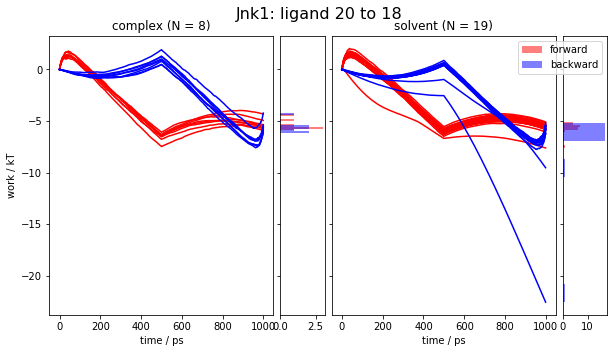

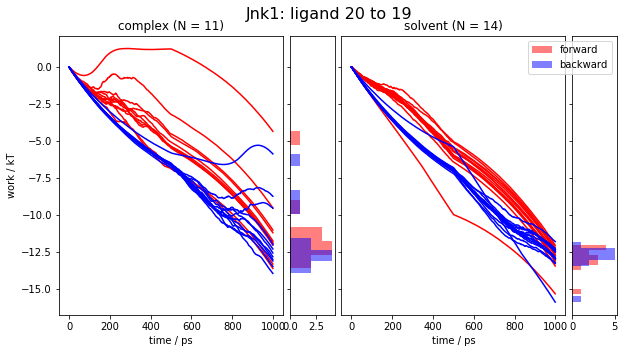

In [11]:
for index in range(0,550):

#     if int(RUN[3:]) < 111:
# #         print(RUN[3:])
#         continue
    RUN = f'RUN{index}'
    if RUN in work[projects['complex']].keys() and RUN in work[projects['solvent']].keys():
        fig, axes = plt.subplots(ncols=4,nrows=1,sharey=True,figsize=(12,5),gridspec_kw={'width_ratios': [5,1,5,1]})

        forward_work_complex = list()
        reverse_work_complex = list()
        for CLONE in work[projects['complex']][RUN].keys():
            try:
                protocol_work = work[projects['complex']][RUN][CLONE][GEN]
                forward_work_complex.append(protocol_work[1000:2000] - protocol_work[1000])
                reverse_work_complex.append(protocol_work[3000:4000] - protocol_work[3000])
            except Exception as e:
                pass

            forward_work = np.array(forward_work_complex)
        reverse_work = np.array(reverse_work_complex)
        complex_fe = BAR(forward_work[:,-1],reverse_work[:,-1])

        ax = axes[0]
        ax.plot(+forward_work.T, 'r-')    
        ax.plot(-reverse_work.T, 'b-')  
        ax.set_xlabel('time / ps')
        ax.set_ylabel('work / kT')
        ax.set_title(f'complex (N = {len(forward_work)})')

        hist_plot = axes[1]
        # TODO make histograms prettier
        hist_plot.hist(forward_work[:,-1], orientation='horizontal',linewidth=3,color='r',alpha=0.5)    
        hist_plot.hist(-reverse_work[:,-1], orientation='horizontal',linewidth=3,color='b',alpha=0.5)    
        complex_fe = BAR(forward_work[:,-1],reverse_work[:,-1])


        forward_work_solvent = list()
        reverse_work_solvent = list()
        for CLONE in work[projects['solvent']][RUN]:
            try:
                protocol_work = work[projects['solvent']][RUN][CLONE][GEN]
                forward_work_solvent.append(protocol_work[1000:2000] - protocol_work[1000])
                reverse_work_solvent.append(protocol_work[3000:4000] - protocol_work[3000])
            except Exception as e:
                pass 

        forward_work = np.array(forward_work_solvent)
        reverse_work = np.array(reverse_work_solvent)
        solvent_fe = BAR(forward_work[:,-1],reverse_work[:,-1])

        ax = axes[2]
        ax.plot(+forward_work.T, 'r-')    
        ax.plot(-reverse_work.T, 'b-')
        ax.set_xlabel('time / ps')
        ax.set_title(f'solvent (N = {len(forward_work)})')

        hist_plot = axes[3]
        hist_plot.hist(forward_work[:,-1], orientation='horizontal',linewidth=3,color='r',alpha=0.5)    
        hist_plot.hist(-reverse_work[:,-1], orientation='horizontal',linewidth=3,color='b',alpha=0.5)       
        solvent_fe = BAR(forward_work[:,-1],reverse_work[:,-1])
        plt.legend(['forward','backward'])
        d = details[RUN]    
        details[RUN]['calculated'] = solvent_fe[0] - complex_fe[0]
        details[RUN]['calculated_err'] = (solvent_fe[1]**2 + complex_fe[1]**2)**0.5
        fig.suptitle(f"{d['protein_pdb'].split('_')[0]}: ligand {d['start_ligand']} to {d['end_ligand']}", fontsize=16)
        fig.subplots_adjust(top=0.9,wspace=0.05)
        plt.show()   

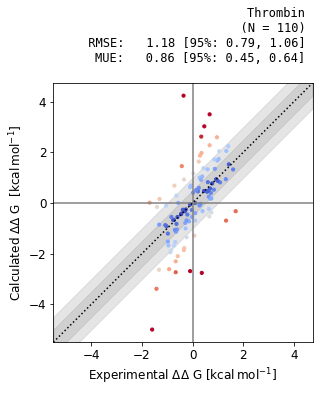

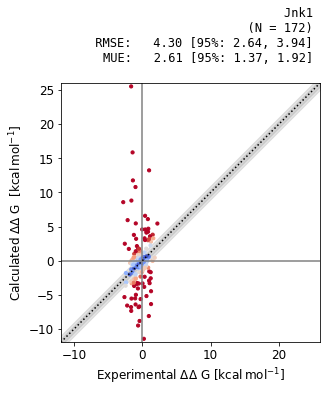

In [87]:


# make this less clunky
colors = {'Thrombin':'hotpink','Jnk1':'purple'}
graph_index = {'Thrombin':0,'Jnk1':1}


#Move this up
from simtk.openmm import unit
from openmmtools.constants import kB
temperature = 300.0 * unit.kelvin
kT = kB * temperature

for t in ['Thrombin','Jnk1']:
    x = []
    y = []
    y_err = []
    for d in details.values():
        if len(d) == 6: # length will be 4 if calc is missing
            target = d['protein_pdb'].split('_')[0]
            if t != target:
                continue
            calc_kcal = (d['calculated']*kT).value_in_unit(unit.kilocalories_per_mole)
            calc_err_kcal = (d['calculated_err']*kT).value_in_unit(unit.kilocalories_per_mole)
            x.append(d['experimental'])
            y.append(calc_kcal)
            y_err.append(calc_err_kcal)

    plotting._master_plot(np.asarray(x),np.asarray(y),title=t)

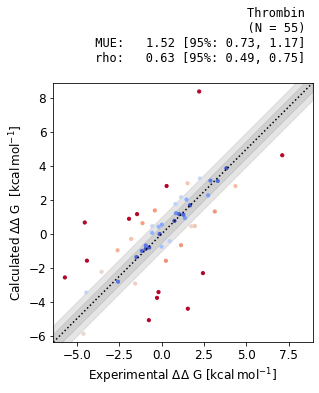

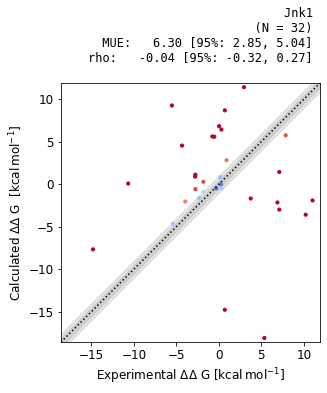

In [77]:
minimal = {}
for d in details.values():
    if len(d) == 6:
        target = d['protein_pdb'].split('_')[0]
        minimal[(target,d['start_ligand'],d['end_ligand'])] = d['calculated']

for target in ['Thrombin','Jnk1']:
    all_x = [minimal[t,i,j] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    all_y = [-minimal[t,j,i] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    plotting._master_plot(np.asarray(all_x),np.asarray(all_y),statistics=['MUE','rho'],origins=False,title=target)
    
    
# NEED TO ADD OPTION TO RELABEL X AND Y AXIS